## ARIMA Model Preparation

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime , calendar
import statistics as st
import math

import os

### Read Dataframe & Modify - Insert New & Rename Columns 

In [2]:
df1 = pd.read_csv("2015-2024_df_INFORM_index_core_indicators.csv")
df1.head()

,COUNTRY,Iso3,INFORMYear,% of Populations at risk of Plasmodium falciparum malaria,Access to Health Care,Access to electricity,Access to improved sanitation facilities,Adult literacy rate,Adult prevalence of HIV-AIDS,Communication,...,Total population,Total refugees,Under 5,Under-five mortality rate,Urban population growth (annual %),Vets per capita,Violent Conflict probability Score,Volume of remittances,Vulnerability Index,Vulnerable Groups
0,Afghanistan,AFG,2015,0.872426,8.9,45.300000,6.5,9.9,0.15,6.9,...,32716210.0,16922.0,8.1,5.6,4.531768,0.008513,10.0,0.4,7.7,6.7
1,Afghanistan,AFG,2016,0.856048,8.6,37.200000,6.4,9.9,0.15,7.3,...,33753499.0,300480.0,8.0,5.4,3.996008,0.009460,10.0,0.6,7.8,7.3
2,Afghanistan,AFG,2017,0.857293,8.6,48.949998,6.2,9.9,0.15,6.5,...,34636207.5,257631.0,8.0,5.2,3.452643,0.007469,10.0,1.2,7.8,7.4
3,Afghanistan,AFG,2018,0.857636,8.3,48.949998,6.0,9.9,0.15,6.4,...,35643417.5,59893.0,7.9,5.0,3.781557,0.005934,10.0,1.5,7.7,7.3
4,Afghanistan,AFG,2019,0.856141,8.0,47.065439,5.8,9.0,0.15,6.3,...,36686784.0,76142.0,7.8,4.8,3.850833,0.005934,10.0,1.5,8.3,8.6


In [3]:
df1.insert(loc=0, column='Year', value=df1['INFORMYear'])

In [4]:
# Group by 'COUNTRY' and calculate the mean of 'INFORM Risk Index' for each country
mean_INFORM_index_by_country = df1.groupby('COUNTRY')['INFORM Risk Index'].mean()

# Insert new column named 'Mean_INFORM_Index' with the mean INFORM Risk Index values for each country
df1['Mean_INFORM_Index'] = df1['COUNTRY'].map(mean_INFORM_index_by_country)

In [5]:
# Insert new column for INFORM Index Category at the beginning of the DataFrame
df1.insert(loc=0, column='INFORM Index Category', value=df1['Mean_INFORM_Index'])

# Define categories and assign labels based on Mean_INFORM_Index
index_cat = []

for i in df1['Mean_INFORM_Index']:
    if 7 <= i <= 10:
        index_cat.append('Very High')
    elif 4.9 <= i < 7:
        index_cat.append('High')
    elif 3.1 <= i < 4.9:
        index_cat.append('Medium')
    elif 2.2 <= i < 3.1:
        index_cat.append('Low') 
    else:
        index_cat.append('Very Low') 

# Assign the index_cat list to the 'INFORM Index Category' column
df1['INFORM Index Category'] = index_cat

In [6]:
#  Alternative Code Insert a new column for INFORM Index Category
#df.insert(loc=0, column='INFORM Index Category', value=df['Mean_INFORM_Index'])

# Define index categories
#index_cat = df['INFORM Index Category']
#inform_cat = []

# Classify INFORM Index Category based on thresholds
#for i in index_cat:
#    if 7 <= i <= 10:
#        inform_cat.append('Very High')
#    elif 4.9 <= i < 7:
#        inform_cat.append('High')
#    elif 3.1 <= i < 4.9:
#        inform_cat.append('Medium')
#    elif 2.2 <= i < 3.1:
#        inform_cat.append('Low')
#    else:
#        inform_cat.append('Very Low')

# Assign categorized values back to the DataFrame
#df['INFORM Index Category'] = inform_cat
#df.head()

In [7]:
df1.rename(columns = {'COUNTRY':'Country'}, inplace=True)

In [8]:
df1.head()

,INFORM Index Category,Year,Country,Iso3,INFORMYear,% of Populations at risk of Plasmodium falciparum malaria,Access to Health Care,Access to electricity,Access to improved sanitation facilities,Adult literacy rate,...,Total refugees,Under 5,Under-five mortality rate,Urban population growth (annual %),Vets per capita,Violent Conflict probability Score,Volume of remittances,Vulnerability Index,Vulnerable Groups,Mean_INFORM_Index
0,Very High,2015,Afghanistan,AFG,2015,0.872426,8.9,45.300000,6.5,9.9,...,16922.0,8.1,5.6,4.531768,0.008513,10.0,0.4,7.7,6.7,8.0
1,Very High,2016,Afghanistan,AFG,2016,0.856048,8.6,37.200000,6.4,9.9,...,300480.0,8.0,5.4,3.996008,0.009460,10.0,0.6,7.8,7.3,8.0
2,Very High,2017,Afghanistan,AFG,2017,0.857293,8.6,48.949998,6.2,9.9,...,257631.0,8.0,5.2,3.452643,0.007469,10.0,1.2,7.8,7.4,8.0
3,Very High,2018,Afghanistan,AFG,2018,0.857636,8.3,48.949998,6.0,9.9,...,59893.0,7.9,5.0,3.781557,0.005934,10.0,1.5,7.7,7.3,8.0
4,Very High,2019,Afghanistan,AFG,2019,0.856141,8.0,47.065439,5.8,9.0,...,76142.0,7.8,4.8,3.850833,0.005934,10.0,1.5,8.3,8.6,8.0


### Export New Dataframe to Group Project Folder

In [9]:
# Define the folder path where you want to save the DataFrames
folder_path = '~/Desktop/CodeOp/DSF02/Group Project'

# Construct the file path
file_path = os.path.join(folder_path, f"2015-2024_year_df_INFORM_index_core_indicators_mean_index.csv")

# Save each DataFrame as a separate CSV file in the specified folder
df1.to_csv(file_path, index=False)

### Import New Dataframe as df - modify INFORMYear to Index & EDA Plots for Time Series Analysis 

In [10]:
df = pd.read_csv("2015-2024_year_df_INFORM_index_core_indicators_mean_index.csv", index_col = 'INFORMYear', 
                 parse_dates=True)
df.head()

,INFORM Index Category,Year,Country,Iso3,% of Populations at risk of Plasmodium falciparum malaria,Access to Health Care,Access to electricity,Access to improved sanitation facilities,Adult literacy rate,Adult prevalence of HIV-AIDS,...,Total refugees,Under 5,Under-five mortality rate,Urban population growth (annual %),Vets per capita,Violent Conflict probability Score,Volume of remittances,Vulnerability Index,Vulnerable Groups,Mean_INFORM_Index
INFORMYear,,,,,,,,,,,,,,,,,,,,,
2015-01-01,Very High,2015,Afghanistan,AFG,0.872426,8.9,45.300000,6.5,9.9,0.15,...,16922.0,8.1,5.6,4.531768,0.008513,10.0,0.4,7.7,6.7,8.0
2016-01-01,Very High,2016,Afghanistan,AFG,0.856048,8.6,37.200000,6.4,9.9,0.15,...,300480.0,8.0,5.4,3.996008,0.009460,10.0,0.6,7.8,7.3,8.0
2017-01-01,Very High,2017,Afghanistan,AFG,0.857293,8.6,48.949998,6.2,9.9,0.15,...,257631.0,8.0,5.2,3.452643,0.007469,10.0,1.2,7.8,7.4,8.0
2018-01-01,Very High,2018,Afghanistan,AFG,0.857636,8.3,48.949998,6.0,9.9,0.15,...,59893.0,7.9,5.0,3.781557,0.005934,10.0,1.5,7.7,7.3,8.0
2019-01-01,Very High,2019,Afghanistan,AFG,0.856141,8.0,47.065439,5.8,9.0,0.15,...,76142.0,7.8,4.8,3.850833,0.005934,10.0,1.5,8.3,8.6,8.0


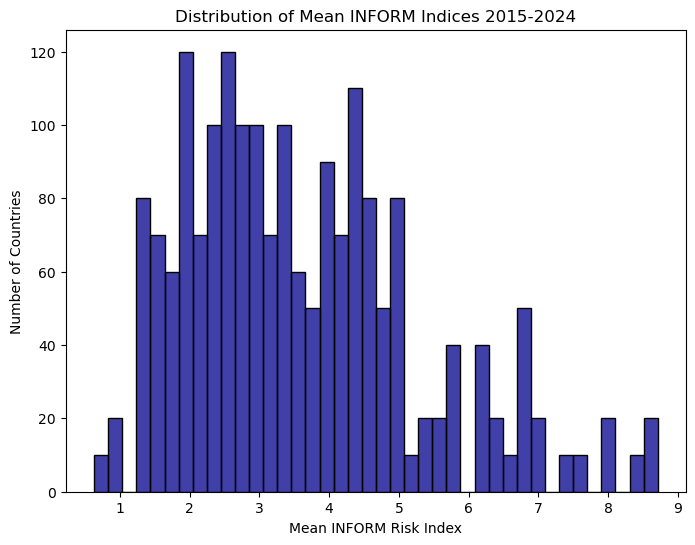

In [11]:
# Histogram showing INFORM Index Distribution
plt.figure(figsize=(8, 6))  # Set the figure size

plt.title("Distribution of Mean INFORM Indices 2015-2024")  # Title for the plot

# Create the histogram plot with custom color and size
sns.histplot(data=df, x="Mean_INFORM_Index", color='darkblue', bins=40) #bins = size (thick/thin) of bars
plt.xlabel("Mean INFORM Risk Index")  # Label for the x-axis
plt.ylabel("Number of Countries")  # Label for the y-axis - not required

plt.show()

In [12]:
df_vlow = df[df['Mean_INFORM_Index'].between (0, 2.2)]
df_vlow.shape

(380, 64)

In [13]:
df_low = df[df['Mean_INFORM_Index'].between (2.2,3.1)] # greater than or equal to 2.2, to less than 3.1
df_low.shape

(490, 64)

In [14]:
df_med = df[df['Mean_INFORM_Index'].between (3.1,4.9)]
df_med.shape

(670, 64)

In [15]:
df_high = df[df['Mean_INFORM_Index'].between (4.9,7)]
df_high.shape

(310, 64)

In [16]:
df_vhigh = df[df['Mean_INFORM_Index'].between (7,10)]
df_vhigh.shape

(70, 64)

In [17]:
df_vhigh.head()

,INFORM Index Category,Year,Country,Iso3,% of Populations at risk of Plasmodium falciparum malaria,Access to Health Care,Access to electricity,Access to improved sanitation facilities,Adult literacy rate,Adult prevalence of HIV-AIDS,...,Total refugees,Under 5,Under-five mortality rate,Urban population growth (annual %),Vets per capita,Violent Conflict probability Score,Volume of remittances,Vulnerability Index,Vulnerable Groups,Mean_INFORM_Index
INFORMYear,,,,,,,,,,,,,,,,,,,,,
2015-01-01,Very High,2015,Afghanistan,AFG,0.872426,8.9,45.300000,6.5,9.9,0.15,...,16922.0,8.1,5.6,4.531768,0.008513,10.0,0.4,7.7,6.7,8.0
2016-01-01,Very High,2016,Afghanistan,AFG,0.856048,8.6,37.200000,6.4,9.9,0.15,...,300480.0,8.0,5.4,3.996008,0.009460,10.0,0.6,7.8,7.3,8.0
2017-01-01,Very High,2017,Afghanistan,AFG,0.857293,8.6,48.949998,6.2,9.9,0.15,...,257631.0,8.0,5.2,3.452643,0.007469,10.0,1.2,7.8,7.4,8.0
2018-01-01,Very High,2018,Afghanistan,AFG,0.857636,8.3,48.949998,6.0,9.9,0.15,...,59893.0,7.9,5.0,3.781557,0.005934,10.0,1.5,7.7,7.3,8.0
2019-01-01,Very High,2019,Afghanistan,AFG,0.856141,8.0,47.065439,5.8,9.0,0.15,...,76142.0,7.8,4.8,3.850833,0.005934,10.0,1.5,8.3,8.6,8.0


### Export New Index Category Dataframes to Group Project Folder

In [18]:
folder_path = '~/Desktop/CodeOp/DSF02/Group Project'

file_path = os.path.join(folder_path, f"2015-2024_df_vlow_INFORM_index_core_indicators_mean_index.csv")

df_vlow.to_csv(file_path, index=False)

In [19]:
folder_path = '~/Desktop/CodeOp/DSF02/Group Project'

file_path = os.path.join(folder_path, f"2015-2024_df_low_INFORM_index_core_indicators_mean_index.csv")

df_low.to_csv(file_path, index=False)

In [20]:
folder_path = '~/Desktop/CodeOp/DSF02/Group Project'

file_path = os.path.join(folder_path, f"2015-2024_df_medium_INFORM_index_core_indicators_mean_index.csv")

df_med.to_csv(file_path, index=False)

In [21]:
folder_path = '~/Desktop/CodeOp/DSF02/Group Project'

file_path = os.path.join(folder_path, f"2015-2024_df_high_INFORM_index_core_indicators_mean_index.csv")

df_high.to_csv(file_path, index=False)

In [22]:
folder_path = '~/Desktop/CodeOp/DSF02/Group Project'

file_path = os.path.join(folder_path, f"2015-2024_df_vhigh_INFORM_index_core_indicators_mean_index.csv")

df_vhigh.to_csv(file_path, index=False)

In [23]:
#mean_INFORM_index_by_year = df.groupby('INFORMYear')['INFORM Risk Index'].mean()

#### Plots & EDA

Number of countries: 49.0


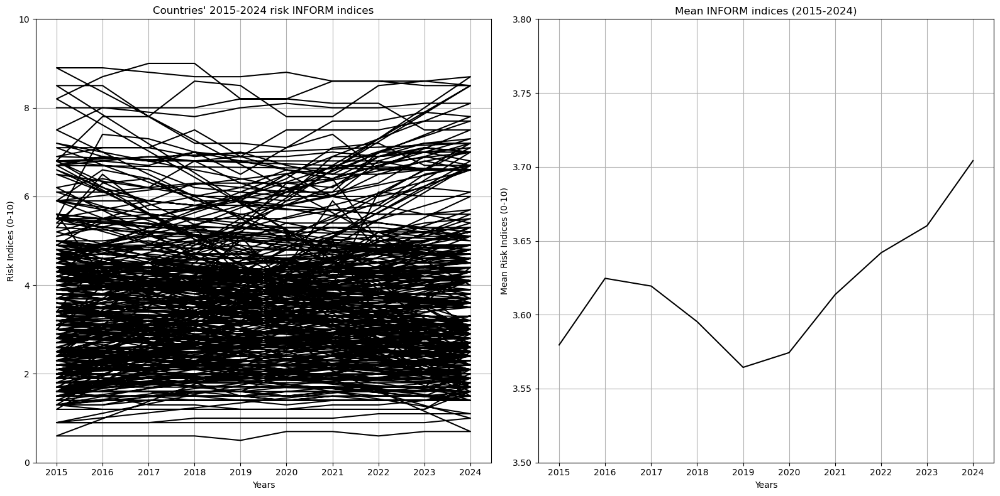

In [24]:
import matplotlib.pyplot as plt

num_countries = len(df_low)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df['INFORM Risk Index'], color = 'black')
axes[0].set_title("Countries' 2015-2024 risk INFORM indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df.groupby('INFORMYear')['INFORM Risk Index'].mean(), color = 'black')
axes[1].set_title("Mean INFORM indices (2015-2024)")
axes[1].set_ylim([3.5, 3.8])

# Adjust layout to prevent overlap
plt.tight_layout()

# Show plots
plt.show()

Number of countries: 191.0


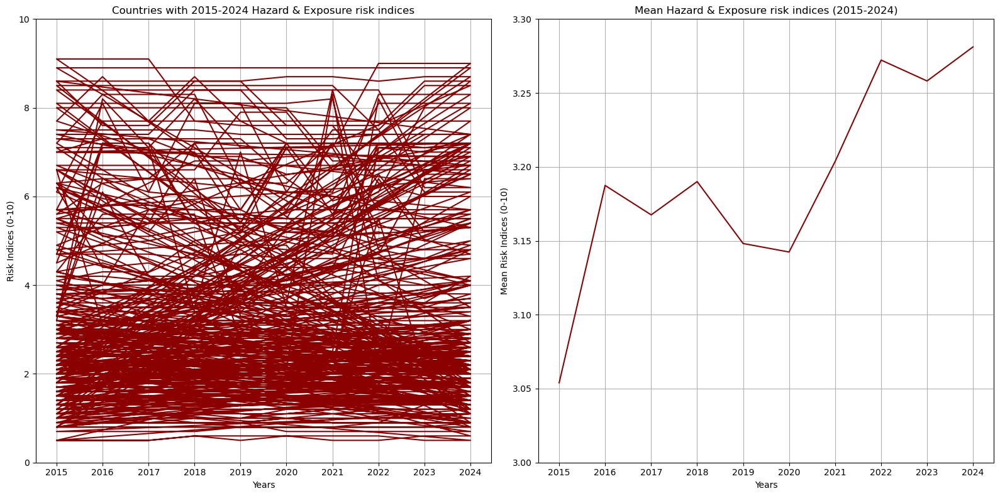

In [25]:
num_countries = len(df)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df['Hazard & Exposure Index'], color ='darkred')
axes[0].set_title("Countries with 2015-2024 Hazard & Exposure risk indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df.groupby('INFORMYear')['Hazard & Exposure Index'].mean(), color ='darkred')
axes[1].set_title("Mean Hazard & Exposure risk indices (2015-2024)")
axes[1].set_ylim([3, 3.3])

plt.tight_layout()
plt.show()

Number of countries: 191.0


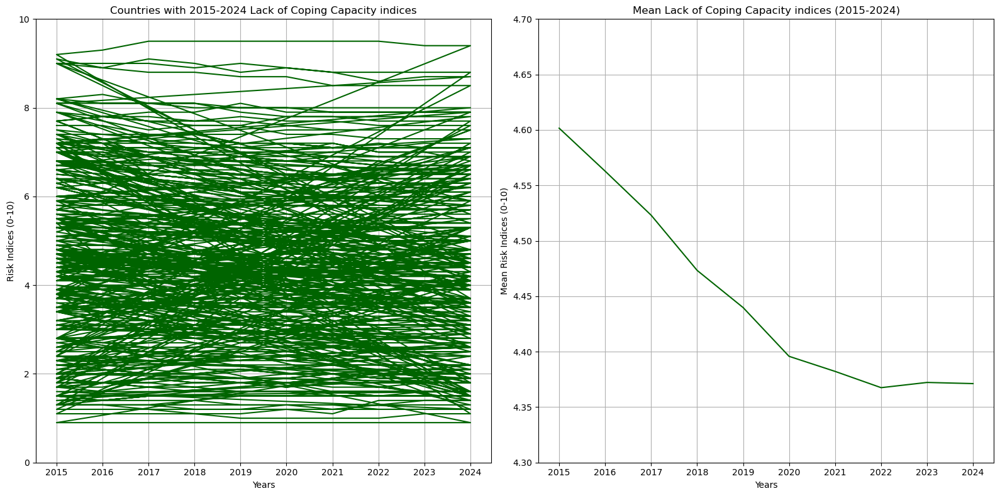

In [26]:
num_countries = len(df)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df['Lack of Coping Capacity Index'], color ='darkgreen')
axes[0].set_title("Countries with 2015-2024 Lack of Coping Capacity indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df.groupby('INFORMYear')['Lack of Coping Capacity Index'].mean(), color ='darkgreen')
axes[1].set_title("Mean Lack of Coping Capacity indices (2015-2024)")
axes[1].set_ylim([4.3, 4.7])

plt.tight_layout()
plt.show()

Number of countries: 191.0


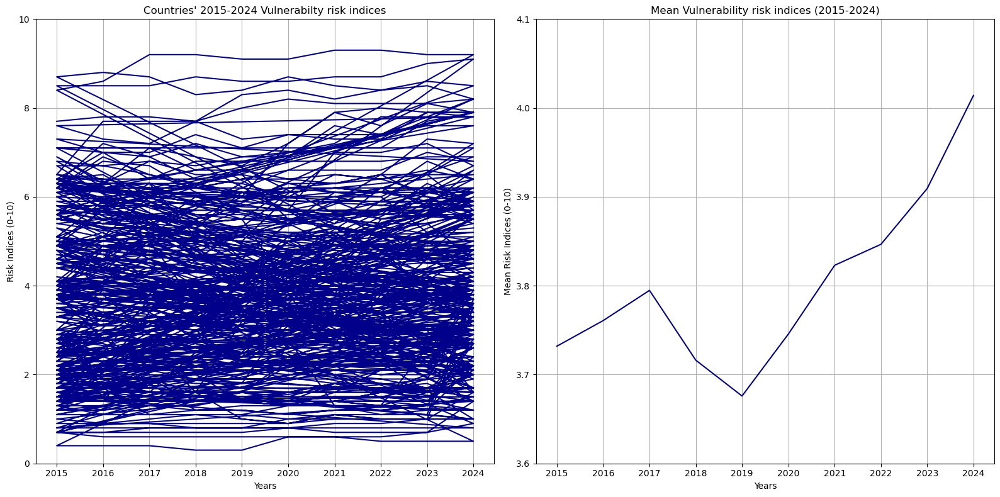

In [27]:
num_countries = len(df)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df['Vulnerability Index'], color ='darkblue')
axes[0].set_title("Countries' 2015-2024 Vulnerabilty risk indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df.groupby('INFORMYear')['Vulnerability Index'].mean(), color ='darkblue')
axes[1].set_title("Mean Vulnerability risk indices (2015-2024)")
axes[1].set_ylim([3.6, 4.1])

plt.tight_layout()
plt.show()

Number of countries: 38.0


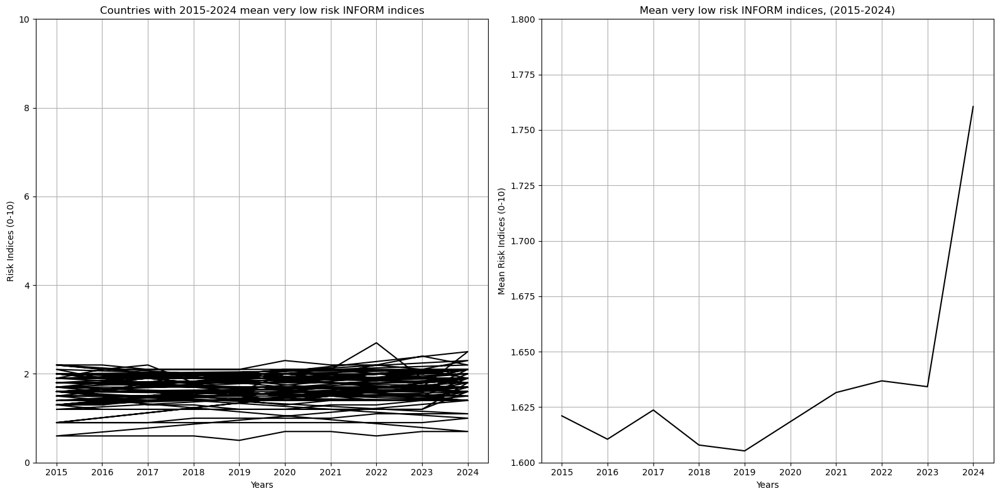

In [28]:
num_countries = len(df_vlow)/10
print("Number of countries:", num_countries)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_vlow['INFORM Risk Index'], color = 'black')
axes[0].set_title("Countries with 2015-2024 mean very low risk INFORM indices")
axes[0].set_ylim([0, 10])

axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_vlow.groupby('INFORMYear')['INFORM Risk Index'].mean(), color = 'black')
axes[1].set_title("Mean very low risk INFORM indices, (2015-2024)")
axes[1].set_ylim([1.6, 1.8])

plt.tight_layout()

plt.show()

Number of countries: 38.0


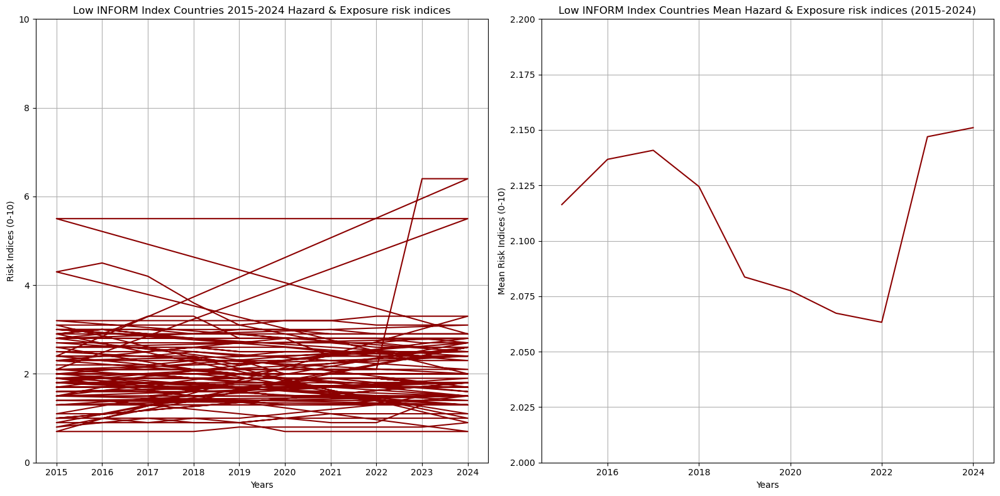

In [29]:
num_countries = len(df_vlow)/10
print("Number of countries:", num_countries)
#print("Peak in 2021:", max(df_vlow)['Year'] ==2021)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_low['Hazard & Exposure Index'], color ='darkred')
axes[0].set_title("Low INFORM Index Countries 2015-2024 Hazard & Exposure risk indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_low.groupby('Year')['Hazard & Exposure Index'].mean(), color ='darkred')
axes[1].set_title("Low INFORM Index Countries Mean Hazard & Exposure risk indices (2015-2024)")
axes[1].set_ylim([2, 2.2])

plt.tight_layout()
plt.show()

Number of countries: 38.0


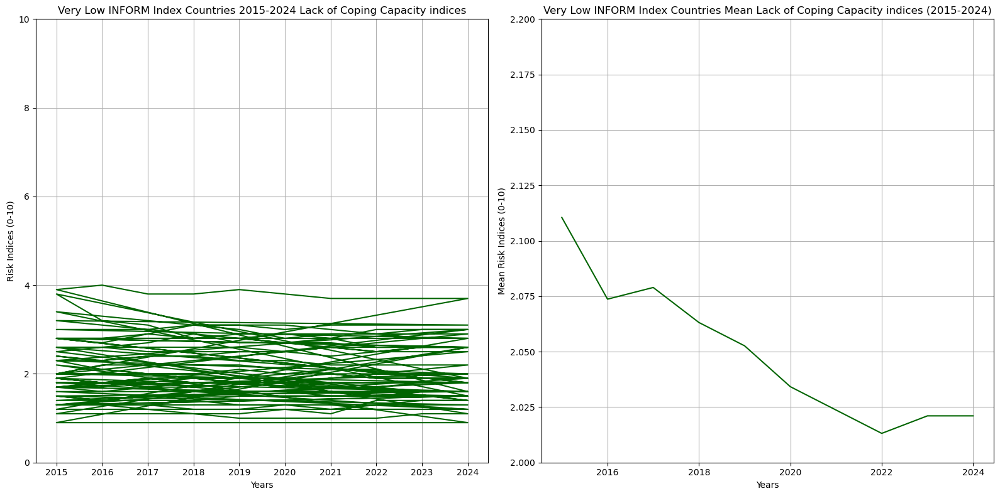

In [30]:
num_countries = len(df_vlow)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_vlow['Lack of Coping Capacity Index'], color ='darkgreen')
axes[0].set_title("Very Low INFORM Index Countries 2015-2024 Lack of Coping Capacity indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_vlow.groupby('Year')['Lack of Coping Capacity Index'].mean(), color ='darkgreen')
axes[1].set_title("Very Low INFORM Index Countries Mean Lack of Coping Capacity indices (2015-2024)")
axes[1].set_ylim([2, 2.2])

plt.tight_layout()
plt.show()

Number of countries: 38.0


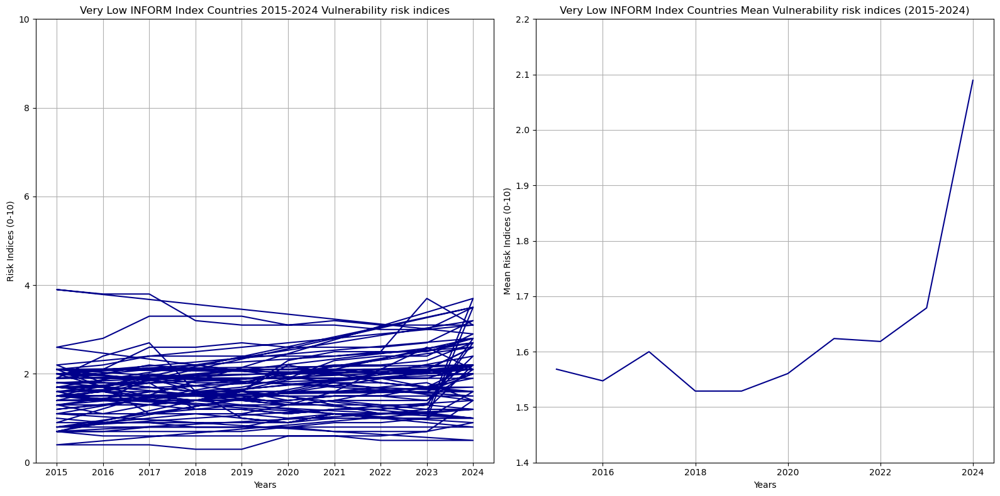

In [31]:
num_countries = len(df_vlow)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_vlow['Vulnerability Index'], color ='darkblue')
axes[0].set_title("Very Low INFORM Index Countries 2015-2024 Vulnerability risk indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_vlow.groupby('Year')['Vulnerability Index'].mean(), color ='darkblue')
axes[1].set_title("Very Low INFORM Index Countries Mean Vulnerability risk indices (2015-2024)")
axes[1].set_ylim([1.4, 2.2])

plt.tight_layout()
plt.show()

Number of countries: 49.0


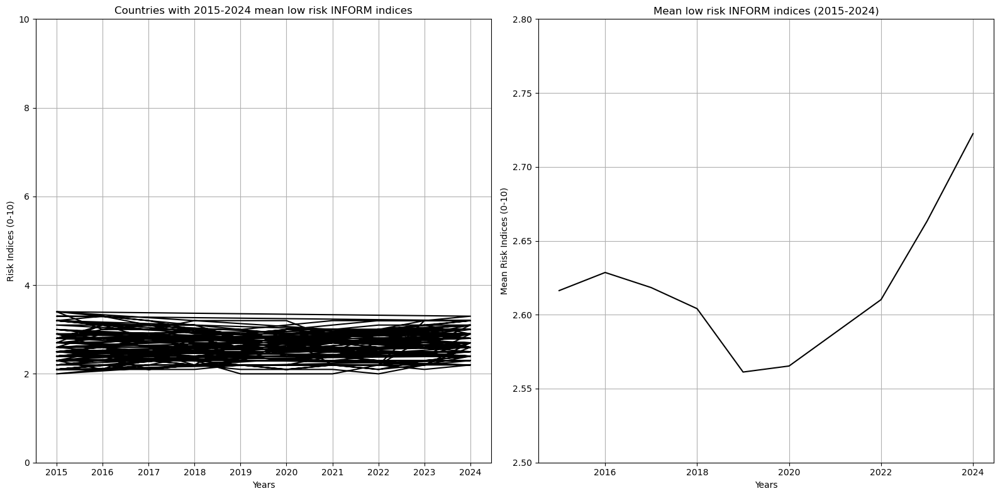

In [32]:
num_countries = len(df_low)/10
print("Number of countries:", num_countries)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_low['INFORM Risk Index'], color='black')
axes[0].set_title("Countries with 2015-2024 mean low risk INFORM indices")
axes[0].set_ylim([0, 10])

axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_low.groupby('Year')['INFORM Risk Index'].mean(), color='black')
axes[1].set_title("Mean low risk INFORM indices (2015-2024)")
axes[1].set_ylim([2.5, 2.8])

plt.tight_layout()
plt.show()

Number of countries: 49.0


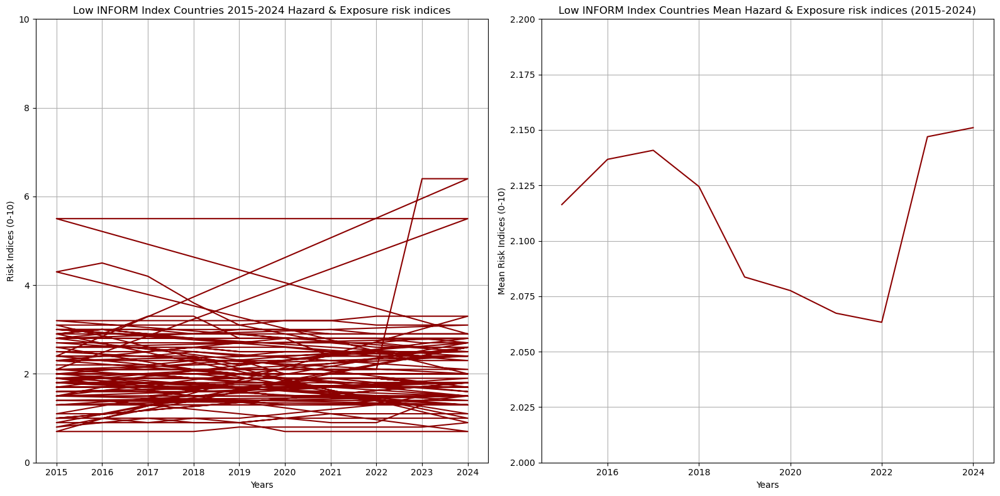

In [34]:
num_countries = len(df_low)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_low['Hazard & Exposure Index'], color ='darkred')
axes[0].set_title("Low INFORM Index Countries 2015-2024 Hazard & Exposure risk indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_low.groupby('Year')['Hazard & Exposure Index'].mean(), color ='darkred')
axes[1].set_title("Low INFORM Index Countries Mean Hazard & Exposure risk indices (2015-2024)")
axes[1].set_ylim([2, 2.2])

plt.tight_layout()
plt.show()

Number of countries: 49.0


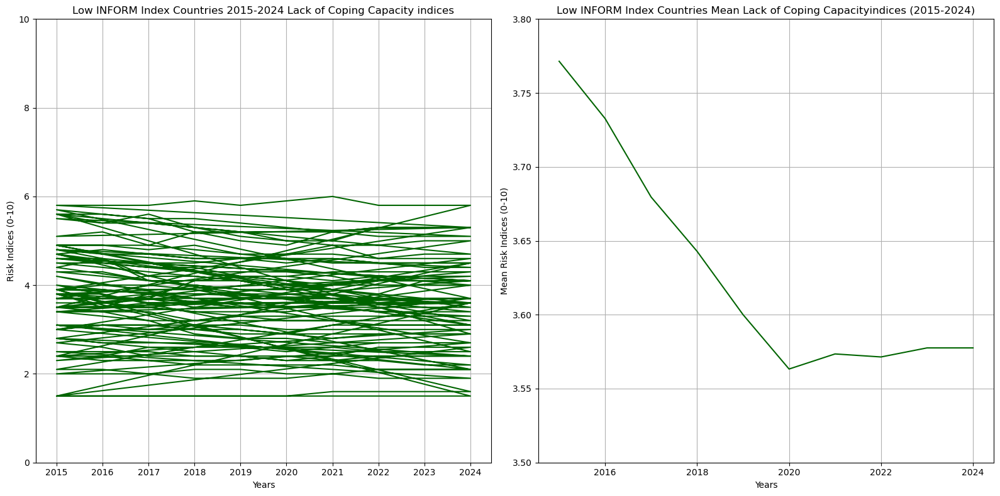

In [35]:
num_countries = len(df_low)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_low['Lack of Coping Capacity Index'], color ='darkgreen')
axes[0].set_title("Low INFORM Index Countries 2015-2024 Lack of Coping Capacity indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_low.groupby('Year')['Lack of Coping Capacity Index'].mean(), color ='darkgreen')
axes[1].set_title("Low INFORM Index Countries Mean Lack of Coping Capacityindices (2015-2024)")
axes[1].set_ylim([3.5, 3.8])

plt.tight_layout()
plt.show()

Number of countries: 49.0


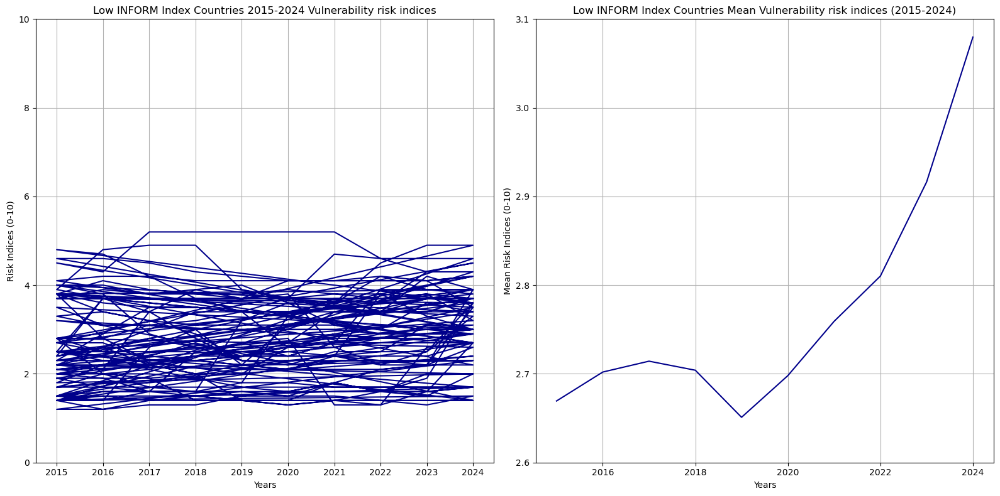

In [36]:
num_countries = len(df_low)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_low['Vulnerability Index'], color ='darkblue')
axes[0].set_title("Low INFORM Index Countries 2015-2024 Vulnerability risk indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_low.groupby('Year')['Vulnerability Index'].mean(), color ='darkblue')
axes[1].set_title("Low INFORM Index Countries Mean Vulnerability risk indices (2015-2024)")
axes[1].set_ylim([2.6, 3.1])

plt.tight_layout()
plt.show()

Number of countries: 67.0


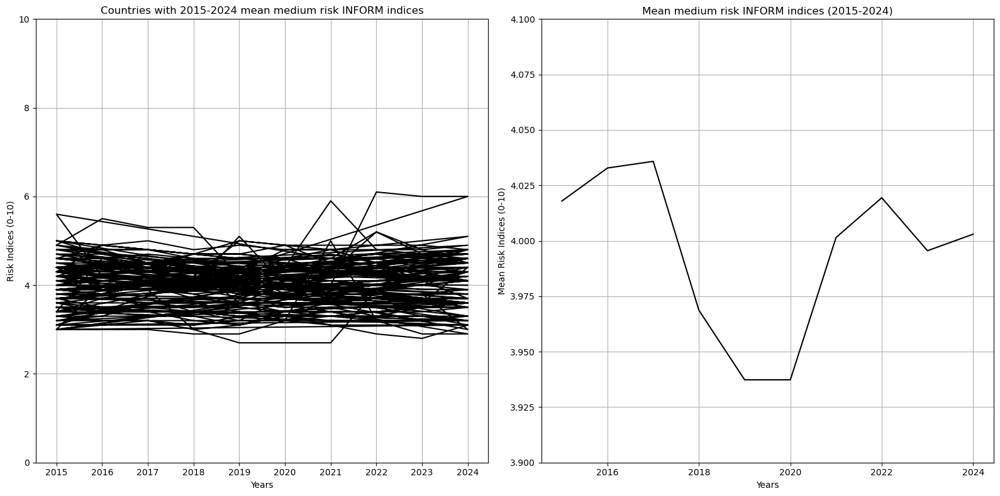

In [37]:
num_countries = len(df_med)/10
print("Number of countries:", num_countries)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_med['INFORM Risk Index'], color= 'black')
axes[0].set_title("Countries with 2015-2024 mean medium risk INFORM indices")
axes[0].set_ylim([0, 10])

axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_med.groupby('Year')['INFORM Risk Index'].mean(), color = 'black')
axes[1].set_title("Mean medium risk INFORM indices (2015-2024)")
axes[1].set_ylim([3.9, 4.1])

plt.tight_layout()
plt.show()

Number of countries: 67.0


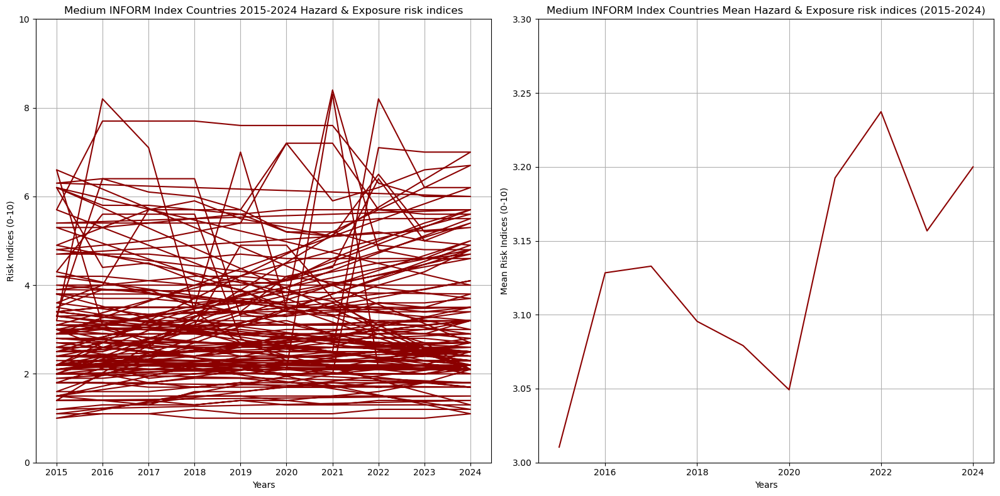

In [38]:
num_countries = len(df_med)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_med['Hazard & Exposure Index'], color ='darkred')
axes[0].set_title("Medium INFORM Index Countries 2015-2024 Hazard & Exposure risk indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_med.groupby('Year')['Hazard & Exposure Index'].mean(), color ='darkred')
axes[1].set_title("Medium INFORM Index Countries Mean Hazard & Exposure risk indices (2015-2024)")
axes[1].set_ylim([3, 3.3])

plt.tight_layout()
plt.show()

Number of countries: 67.0


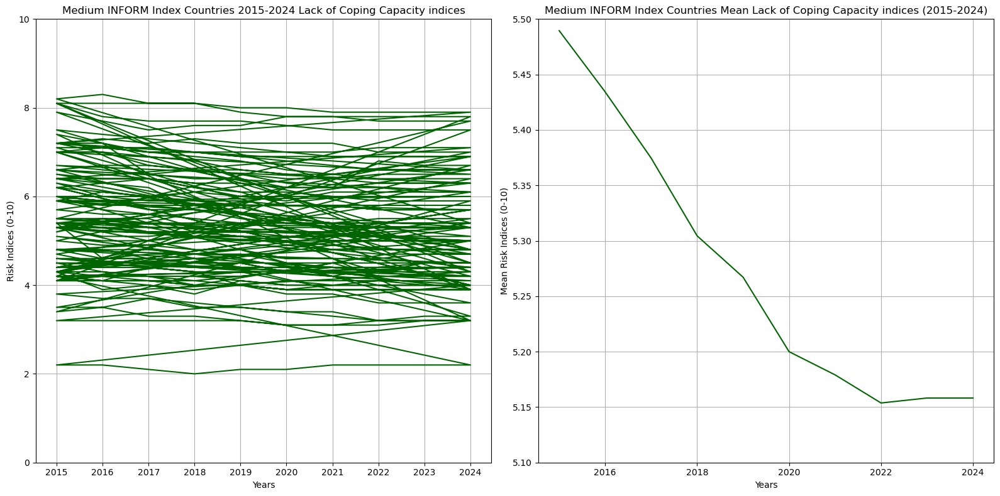

In [39]:
num_countries = len(df_med)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_med['Lack of Coping Capacity Index'], color ='darkgreen')
axes[0].set_title("Medium INFORM Index Countries 2015-2024 Lack of Coping Capacity indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_med.groupby('Year')['Lack of Coping Capacity Index'].mean(), color ='darkgreen')
axes[1].set_title("Medium INFORM Index Countries Mean Lack of Coping Capacity indices (2015-2024)")
axes[1].set_ylim([5.1, 5.5])

plt.tight_layout()
plt.show()

Number of countries: 67.0


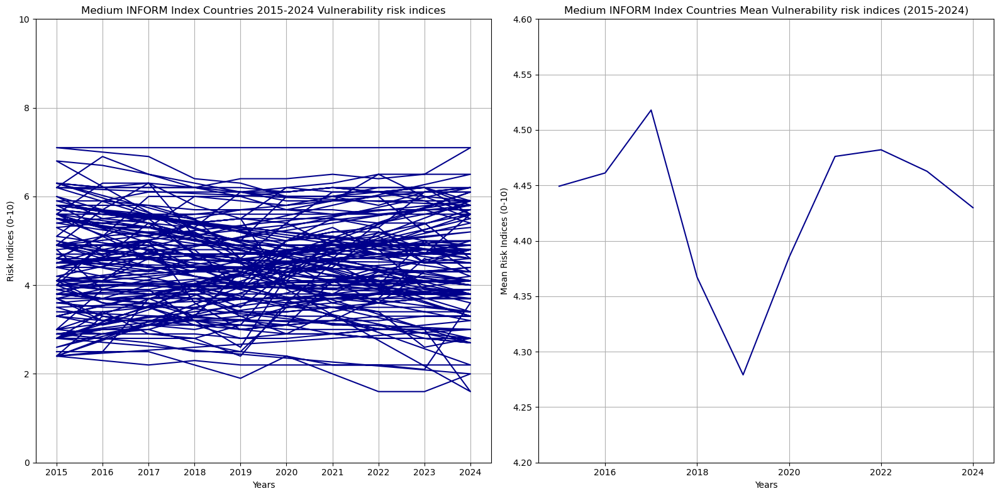

In [40]:
num_countries = len(df_med)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_med['Vulnerability Index'], color ='darkblue')
axes[0].set_title("Medium INFORM Index Countries 2015-2024 Vulnerability risk indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_med.groupby('Year')['Vulnerability Index'].mean(), color ='darkblue')
axes[1].set_title("Medium INFORM Index Countries Mean Vulnerability risk indices (2015-2024)")
axes[1].set_ylim([4.2, 4.6])

plt.tight_layout()
plt.show()

Number of countries: 31.0


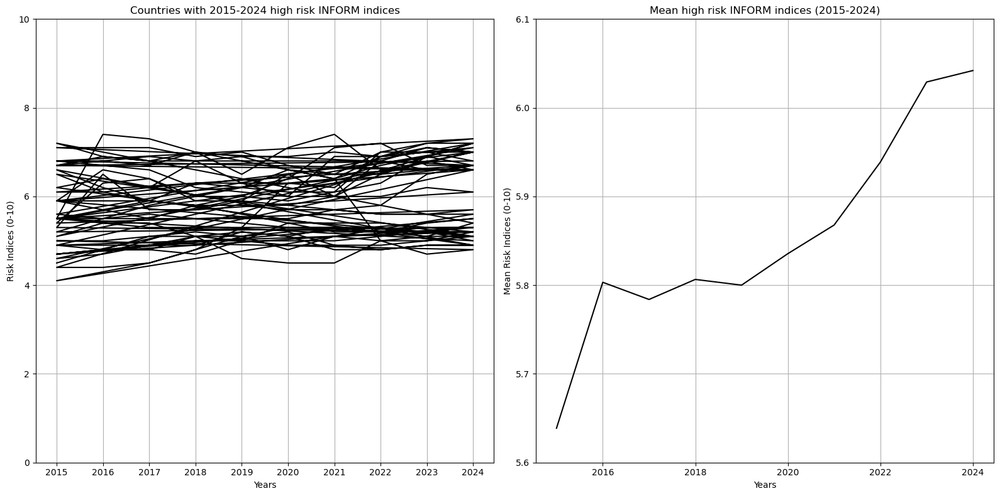

In [41]:
num_countries = len(df_high)/10
print("Number of countries:", num_countries)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_high['INFORM Risk Index'], color = 'black')
axes[0].set_title("Countries with 2015-2024 high risk INFORM indices")
axes[0].set_ylim([0, 10])

axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_high.groupby('Year')['INFORM Risk Index'].mean(), color = 'black')
axes[1].set_title("Mean high risk INFORM indices (2015-2024)")
axes[1].set_ylim([5.6, 6.1])

plt.tight_layout()
plt.show()

Number of countries: 31.0


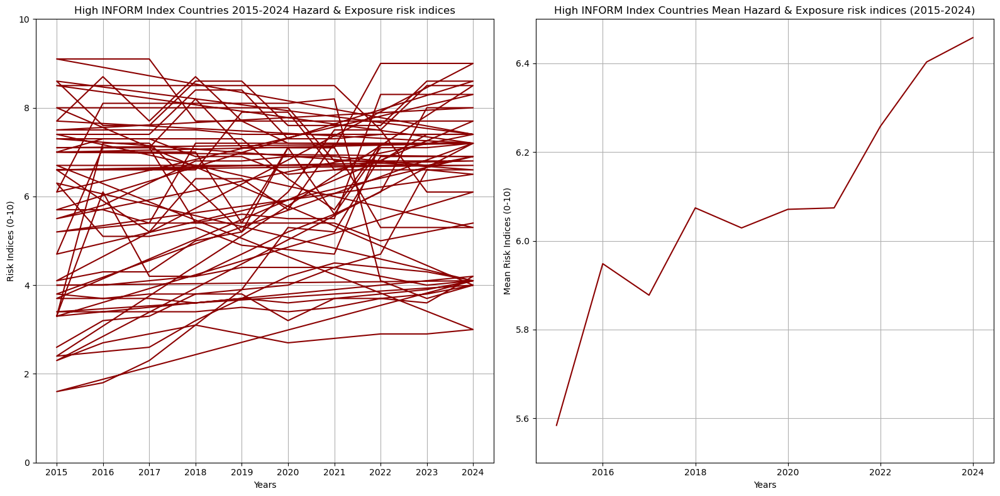

In [42]:
num_countries = len(df_high)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_high['Hazard & Exposure Index'], color ='darkred')
axes[0].set_title("High INFORM Index Countries 2015-2024 Hazard & Exposure risk indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_high.groupby('Year')['Hazard & Exposure Index'].mean(), color ='darkred')
axes[1].set_title("High INFORM Index Countries Mean Hazard & Exposure risk indices (2015-2024)")
axes[1].set_ylim([5.5, 6.5])

plt.tight_layout()
plt.show()

Number of countries: 31.0


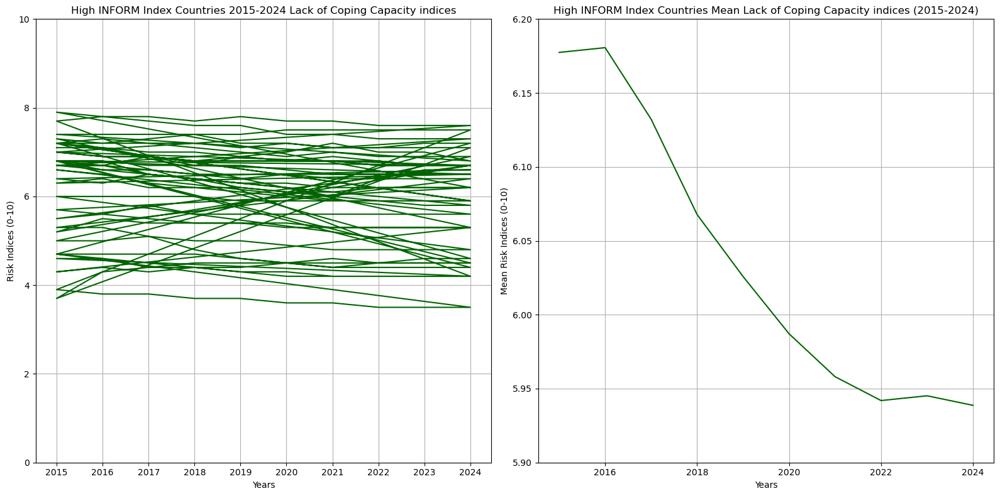

In [43]:
num_countries = len(df_high)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_high['Lack of Coping Capacity Index'], color ='darkgreen')
axes[0].set_title("High INFORM Index Countries 2015-2024 Lack of Coping Capacity indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_high.groupby('Year')['Lack of Coping Capacity Index'].mean(), color ='darkgreen')
axes[1].set_title("High INFORM Index Countries Mean Lack of Coping Capacity indices (2015-2024)")
axes[1].set_ylim([5.9, 6.2])

plt.tight_layout()
plt.show()

Number of countries: 31.0


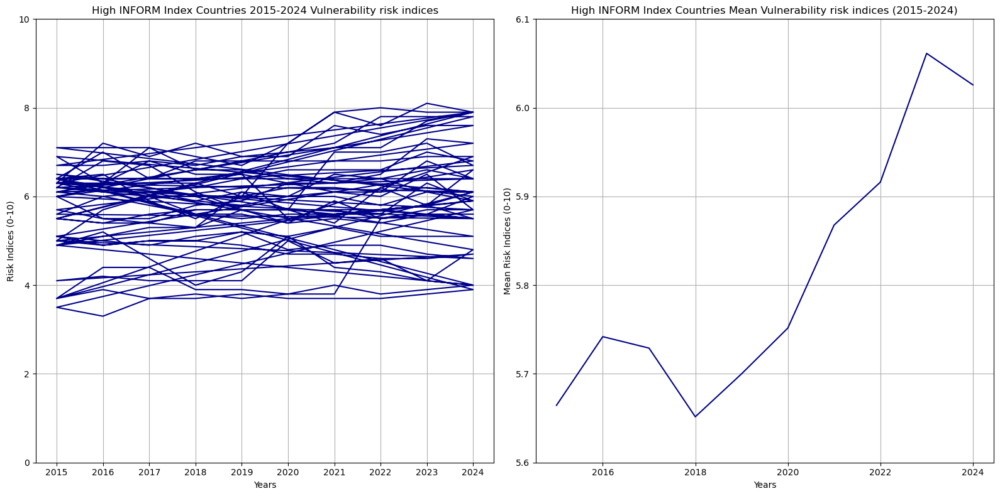

In [44]:
num_countries = len(df_high)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_high['Vulnerability Index'], color ='darkblue')
axes[0].set_title("High INFORM Index Countries 2015-2024 Vulnerability risk indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_high.groupby('Year')['Vulnerability Index'].mean(), color ='darkblue')
axes[1].set_title("High INFORM Index Countries Mean Vulnerability risk indices (2015-2024)")
axes[1].set_ylim([5.6, 6.1])

plt.tight_layout()
plt.show()

Number of countries: 7.0


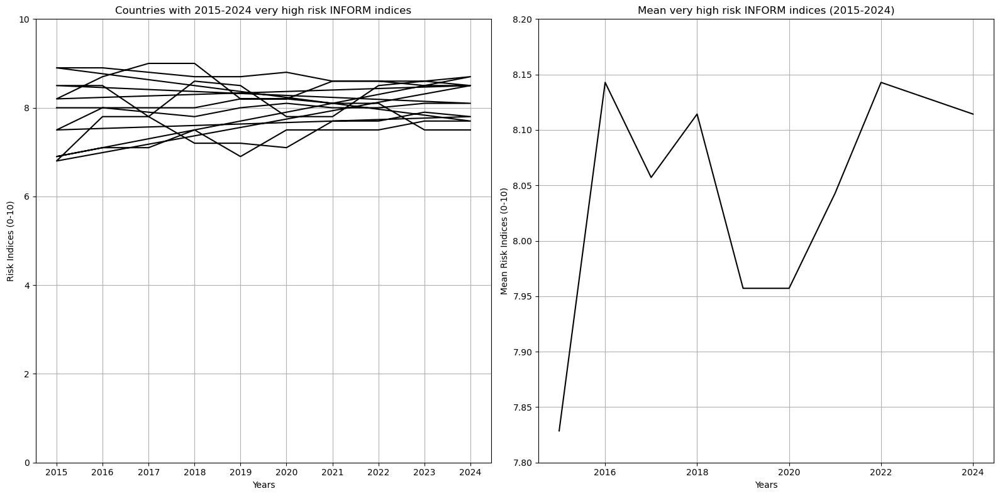

In [45]:
num_countries = len(df_vhigh)/10
print("Number of countries:", num_countries)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_vhigh['INFORM Risk Index'], color = 'black')
axes[0].set_title("Countries with 2015-2024 very high risk INFORM indices")
axes[0].set_ylim([0, 10])

axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_vhigh.groupby('Year')['INFORM Risk Index'].mean(), color = 'black')
axes[1].set_title("Mean very high risk INFORM indices (2015-2024)")
axes[1].set_ylim([7.8, 8.2])

plt.tight_layout()
plt.show()

Number of countries: 7.0


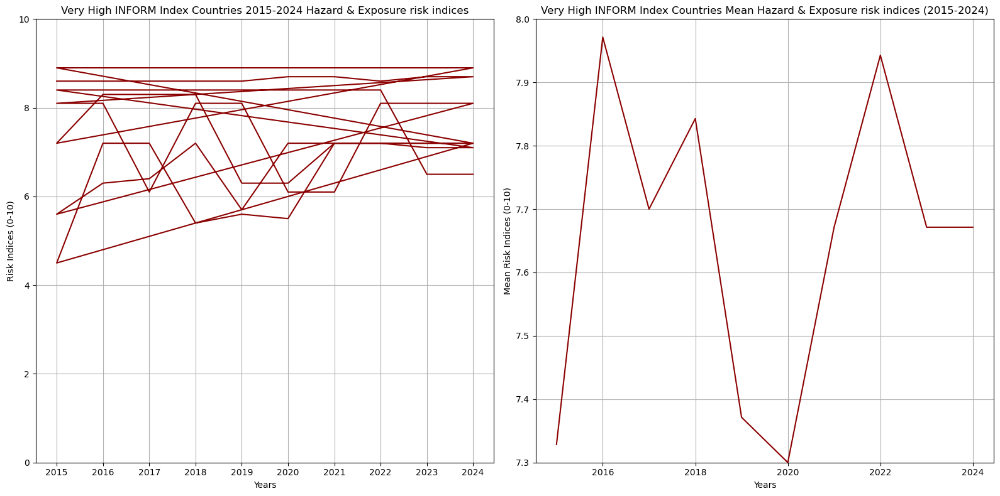

In [46]:
num_countries = len(df_vhigh)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_vhigh['Hazard & Exposure Index'], color ='darkred')
axes[0].set_title("Very High INFORM Index Countries 2015-2024 Hazard & Exposure risk indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_vhigh.groupby('Year')['Hazard & Exposure Index'].mean(), color ='darkred')
axes[1].set_title("Very High INFORM Index Countries Mean Hazard & Exposure risk indices (2015-2024)")
axes[1].set_ylim([7.3, 8])

plt.tight_layout()
plt.show()

Number of countries: 7.0


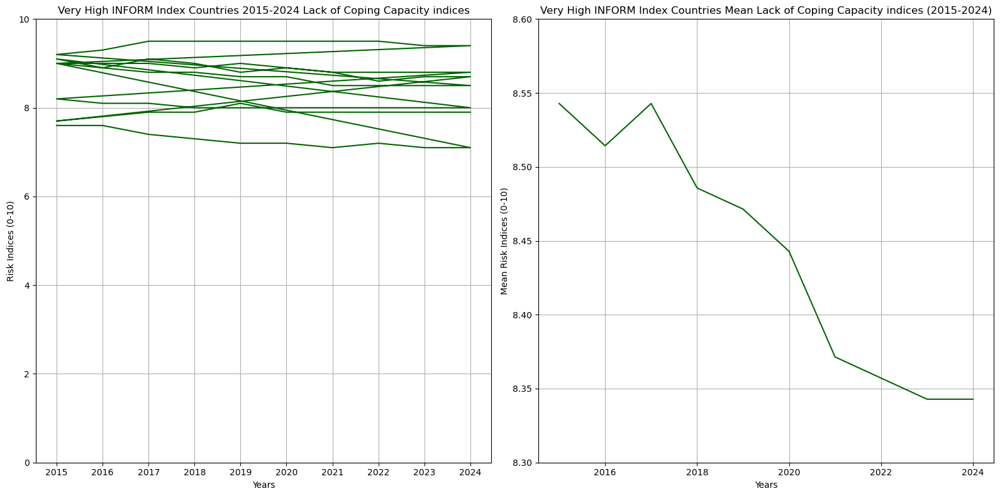

In [47]:
num_countries = len(df_vhigh)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_vhigh['Lack of Coping Capacity Index'], color ='darkgreen')
axes[0].set_title("Very High INFORM Index Countries 2015-2024 Lack of Coping Capacity indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_vhigh.groupby('Year')['Lack of Coping Capacity Index'].mean(), color ='darkgreen')
axes[1].set_title("Very High INFORM Index Countries Mean Lack of Coping Capacity indices (2015-2024)")
axes[1].set_ylim([8.3, 8.6])

plt.tight_layout()
plt.show()

Number of countries: 7.0


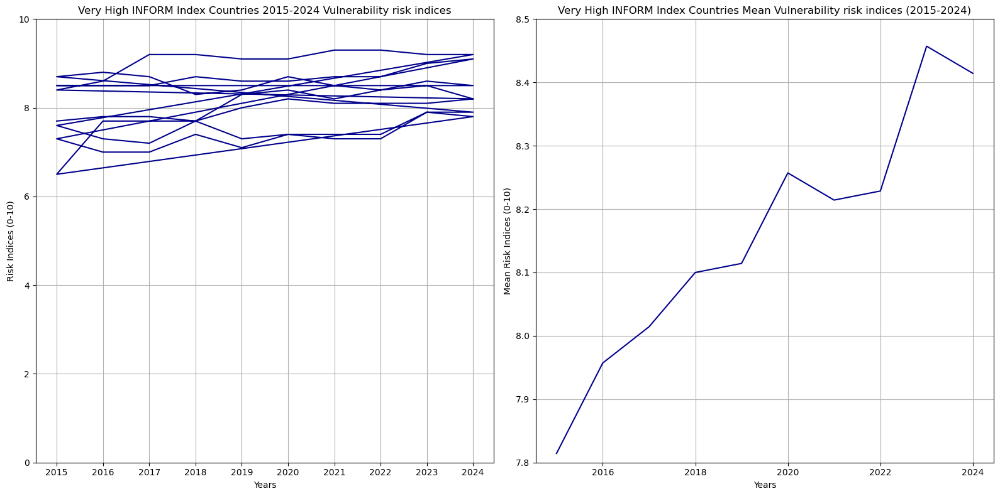

In [48]:
num_countries = len(df_vhigh)/10
print("Number of countries:", num_countries)

# Figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:
axes[0].grid(True)
axes[0].set_xlabel('Years')
axes[0].set_ylabel('Risk Indices (0-10)')
axes[0].plot(df_vhigh['Vulnerability Index'], color ='darkblue')
axes[0].set_title("Very High INFORM Index Countries 2015-2024 Vulnerability risk indices")
axes[0].set_ylim([0, 10])

# Plot 2:
axes[1].grid(True)
axes[1].set_xlabel('Years')
axes[1].set_ylabel('Mean Risk Indices (0-10)')
axes[1].plot(df_vhigh.groupby('Year')['Vulnerability Index'].mean(), color ='darkblue')
axes[1].set_title("Very High INFORM Index Countries Mean Vulnerability risk indices (2015-2024)")
axes[1].set_ylim([7.8, 8.5])

plt.tight_layout()
plt.show()

#### Relationships between INFORM Index & Selected Core Indicators

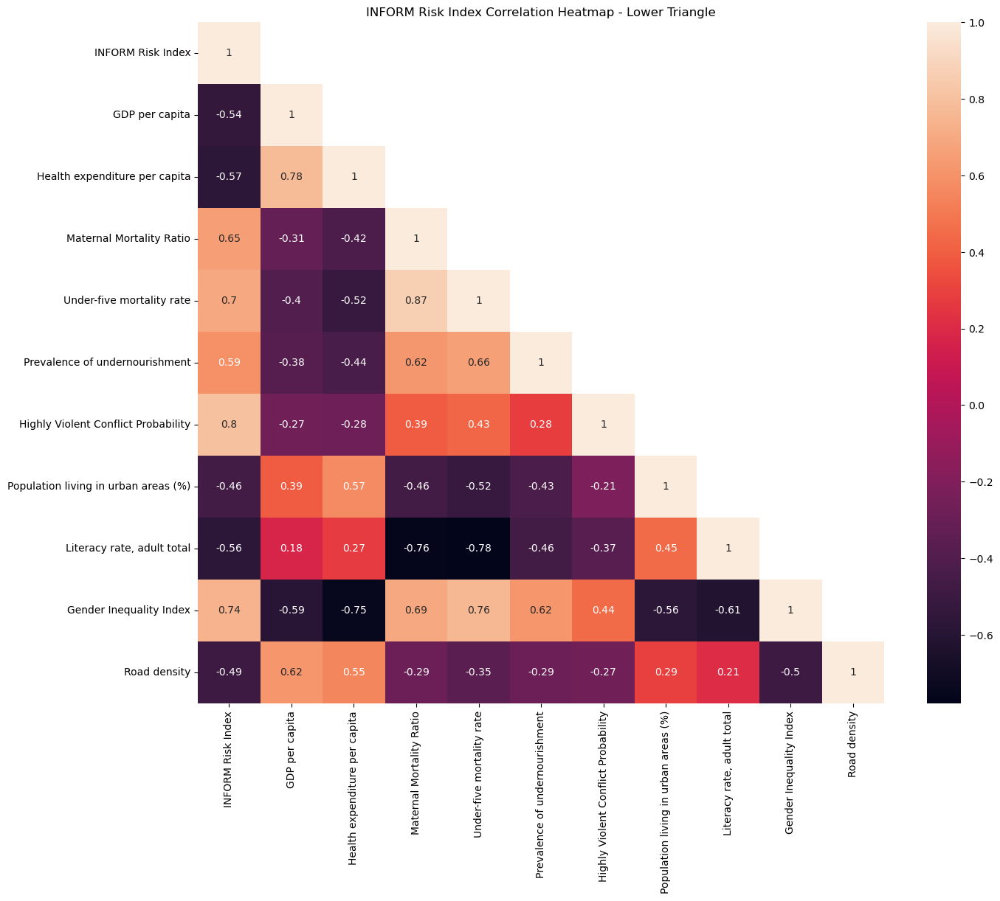

In [59]:
# Removing Upper or Lower Half of Corr Heatmap
inform = df[['INFORM Risk Index',
             'GDP per capita',
             'Health expenditure per capita',
             'Maternal Mortality Ratio',
             'Under-five mortality rate',
             'Prevalence of undernourishment',
             'Highly Violent Conflict Probability',
             'Population living in urban areas (%)',
             'Literacy rate, adult total',
             'Gender Inequality Index',
             'Road density'       
       ]]

#'% of Populations at risk of Plasmodium falciparum malaria',
#'Adult prevalence of HIV-AIDS',  'Corruption Perception Index', 'GDP per capita',
# 'Gender Inequality Index',   'Health expenditure per capita', 'Highly Violent Conflict Probability','Internet users', 'Literacy rate, adult total',
#  'Maternal Mortality Ratio', 'Mobile cellular subscriptions', 'Multidimensional Poverty Index', 'People using at least basic sanitation services (% of population)',
# 'Personal remittances, received (% of GDP)', 'Physicians density', 'Population ages 0-5 (% of total)',
# 'Population living in slums (% of urban population)',   'Population living in urban areas (%)','Prevalence of undernourishment', 'Public aid per capita',
# 'Recent shocks', 'Road density', 'Total affected by Natural Disasters last 3 years (% of total pop)',
# 'Under-five mortality rate', 'Urban population growth (annual %)', 'Vets per capita', 'Vulnerable Groups'
correlation_matrix = inform.corr() # Calculate the correlation matrix

mask = 1 - np.tril(np.ones_like(correlation_matrix)) # Create a mask for the upper triangle

# Create a heatmap of the correlation matrix showing only the lower triangle
plt.figure(figsize=(15, 12))
plt.title('INFORM Risk Index Correlation Heatmap - Lower Triangle')
heatmap = sns.heatmap(correlation_matrix, mask=mask, annot=True) #annot=True adds the numbers to the matrix
plt.show()

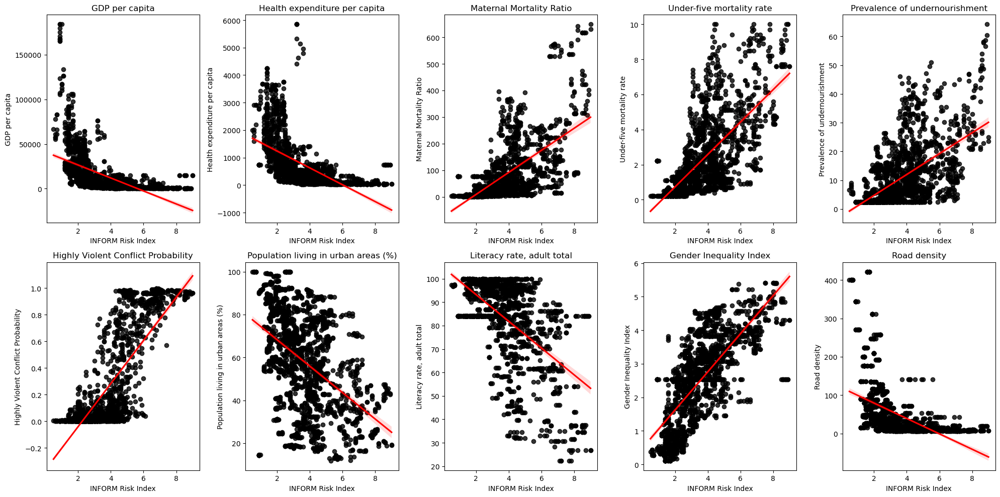

In [77]:
# Figure and subplots
fig, axes = plt.subplots(2, 5, figsize=(20, 10))

# Flatten the axes array to iterate over each subplot
axes = axes.flatten()

# Define x and y variables for each subplot
x_variable = 'INFORM Risk Index'

y_variables = ['GDP per capita',
             'Health expenditure per capita',
             'Maternal Mortality Ratio',
             'Under-five mortality rate',
             'Prevalence of undernourishment',
             'Highly Violent Conflict Probability',
             'Population living in urban areas (%)',
             'Literacy rate, adult total',
             'Gender Inequality Index',
             'Road density']

# Iterate over each subplot and plot your data
for i, ax in enumerate(axes):
    # Plot your data here, using different variables for each subplot
    sns.regplot(
        data=df,
        x=x_variable,
        y=y_variables[i],
        scatter_kws={"color": "black"},  # Set color of the scatter points
        line_kws={"color": "red"},  # Set color of the regression line
        ax=ax  # Specify the current subplot
    )
    # Set title for the subplot
    ax.set_title(f'{y_variables[i]}')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

In [49]:
#print("Peak in 2021:", max.df_vlow['Hazard & Exposure Index'](df_vlow[INFORMYear] ==2021))

# Filter the DataFrame for the year 2021
#df_2021 = df_vlow[df_vlow['INFORMYear'] == 2021]

# Find the maximum value of 'Hazard & Exposure Index' in the year 2021
#max_hazard_2021 = df_2021['Hazard & Exposure Index'].max()

#print("Peak in 2021:", max_hazard_2021)

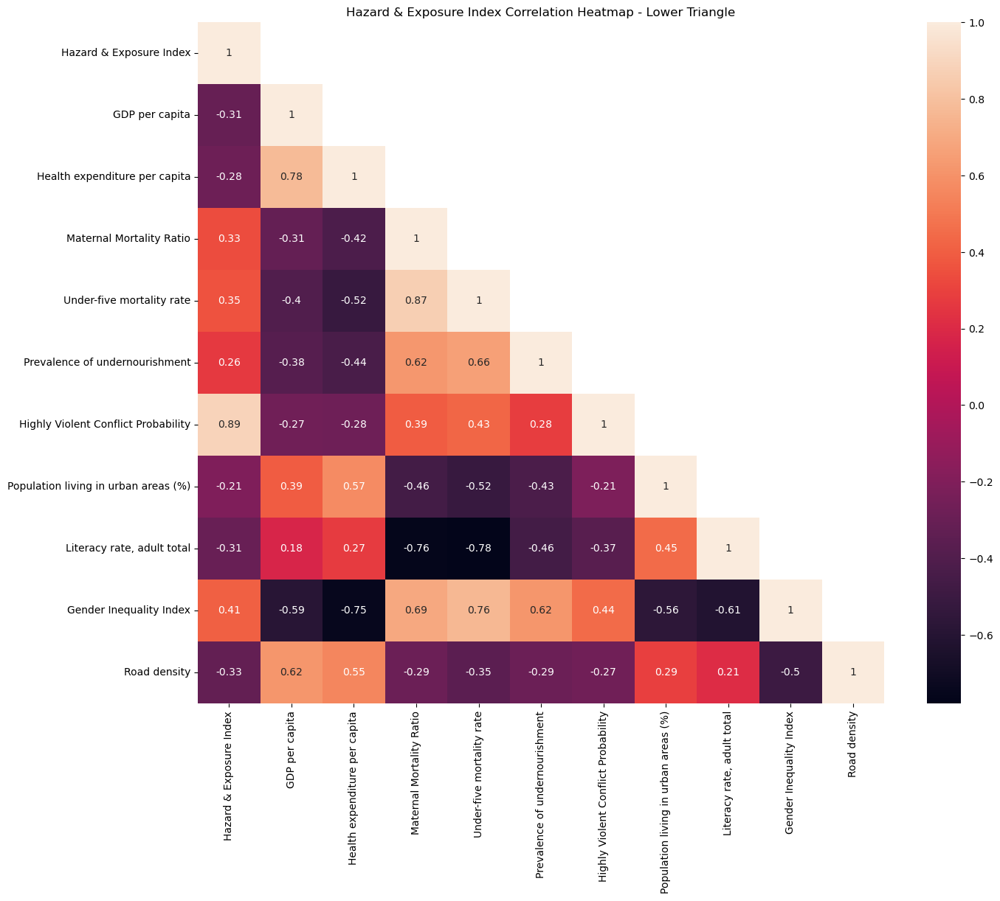

In [80]:
# Removing Upper or Lower Half of Corr Heatmap
inform = df[['Hazard & Exposure Index',
             'GDP per capita',
             'Health expenditure per capita',
             'Maternal Mortality Ratio',
             'Under-five mortality rate',
             'Prevalence of undernourishment',
             'Highly Violent Conflict Probability',
             'Population living in urban areas (%)',
             'Literacy rate, adult total',
             'Gender Inequality Index',
             'Road density'         
       ]]

correlation_matrix = inform.corr() # Calculate the correlation matrix

mask = 1 - np.tril(np.ones_like(correlation_matrix)) # Create a mask for the upper triangle

# Create a heatmap of the correlation matrix showing only the lower triangle
plt.figure(figsize=(15, 12))
plt.title('Hazard & Exposure Index Correlation Heatmap - Lower Triangle')
heatmap = sns.heatmap(correlation_matrix, mask=mask, annot=True) #annot=True adds the numbers to the matrix
plt.show()

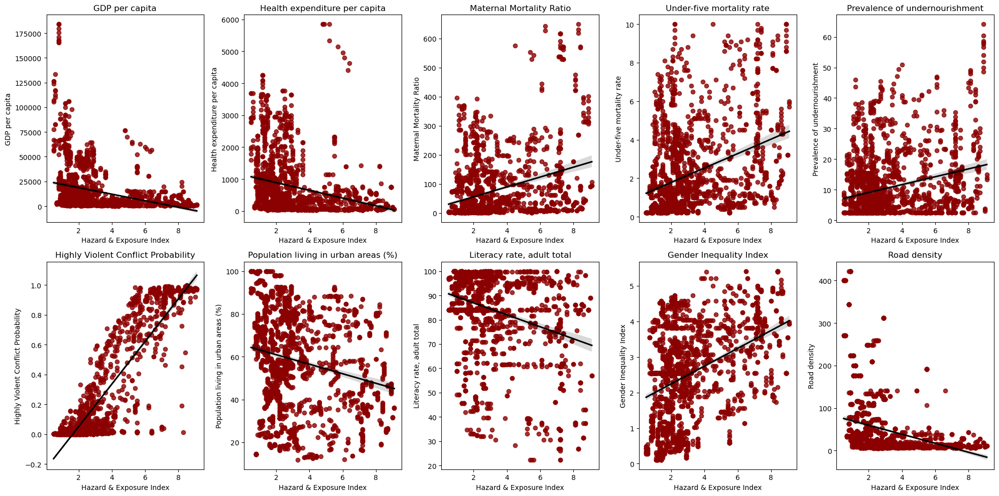

In [79]:
# Figure and subplots
fig, axes = plt.subplots(2, 5, figsize=(20, 10))

# Flatten the axes array to iterate over each subplot
axes = axes.flatten()

# Define x and y variables for each subplot
x_variable = 'Hazard & Exposure Index'

y_variables = ['GDP per capita',
             'Health expenditure per capita',
             'Maternal Mortality Ratio',
             'Under-five mortality rate',
             'Prevalence of undernourishment',
             'Highly Violent Conflict Probability',
             'Population living in urban areas (%)',
             'Literacy rate, adult total',
             'Gender Inequality Index',
             'Road density']

# Iterate over each subplot and plot your data
for i, ax in enumerate(axes):
    # Plot your data here, using different variables for each subplot
    sns.regplot(
        data=df,
        x=x_variable,
        y=y_variables[i],
        scatter_kws={"color": "darkred"},  # Set color of the scatter points
        line_kws={"color": "black"},  # Set color of the regression line
        ax=ax  # Specify the current subplot
    )
    # Set title for the subplot
    ax.set_title(f'{y_variables[i]}')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

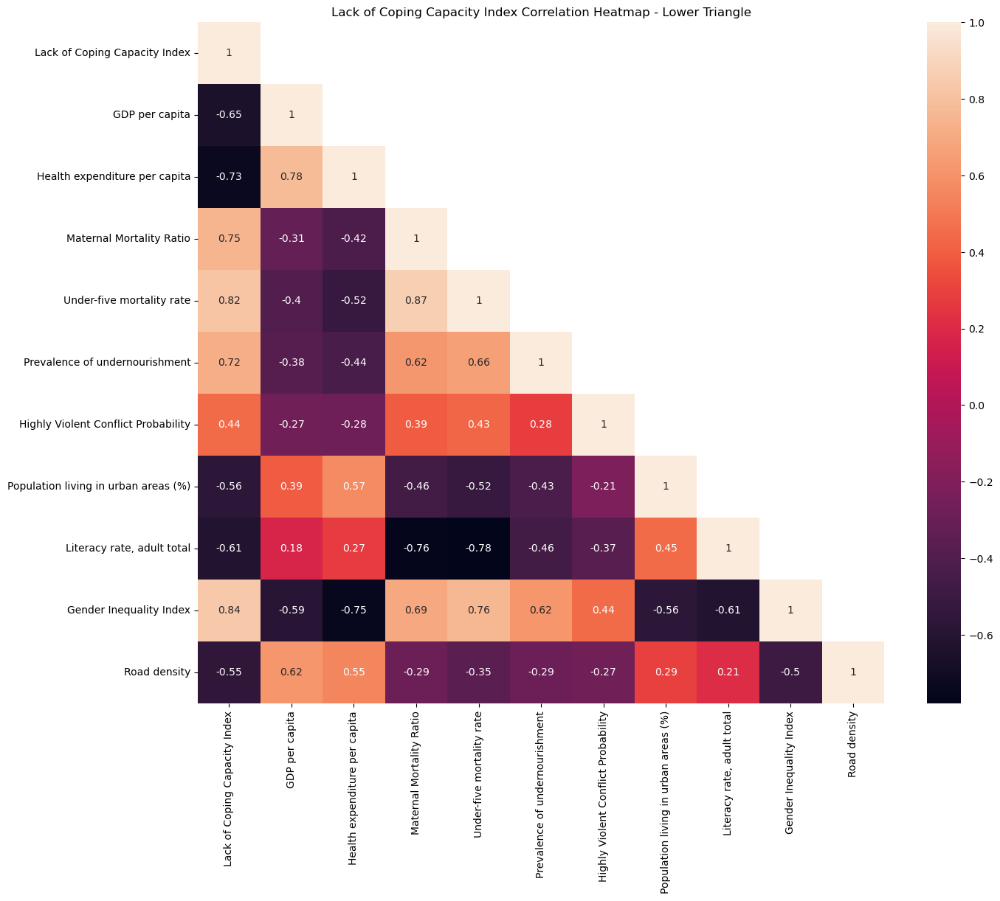

In [81]:
# Removing Upper or Lower Half of Corr Heatmap
inform = df[['Lack of Coping Capacity Index',
             'GDP per capita',
             'Health expenditure per capita',
             'Maternal Mortality Ratio',
             'Under-five mortality rate',
             'Prevalence of undernourishment',
             'Highly Violent Conflict Probability',
             'Population living in urban areas (%)',
             'Literacy rate, adult total',
             'Gender Inequality Index',
             'Road density'         
       ]]

correlation_matrix = inform.corr() # Calculate the correlation matrix

mask = 1 - np.tril(np.ones_like(correlation_matrix)) # Create a mask for the upper triangle

# Create a heatmap of the correlation matrix showing only the lower triangle
plt.figure(figsize=(15, 12))
plt.title('Lack of Coping Capacity Index Correlation Heatmap - Lower Triangle')
heatmap = sns.heatmap(correlation_matrix, mask=mask, annot=True) #annot=True adds the numbers to the matrix
plt.show()

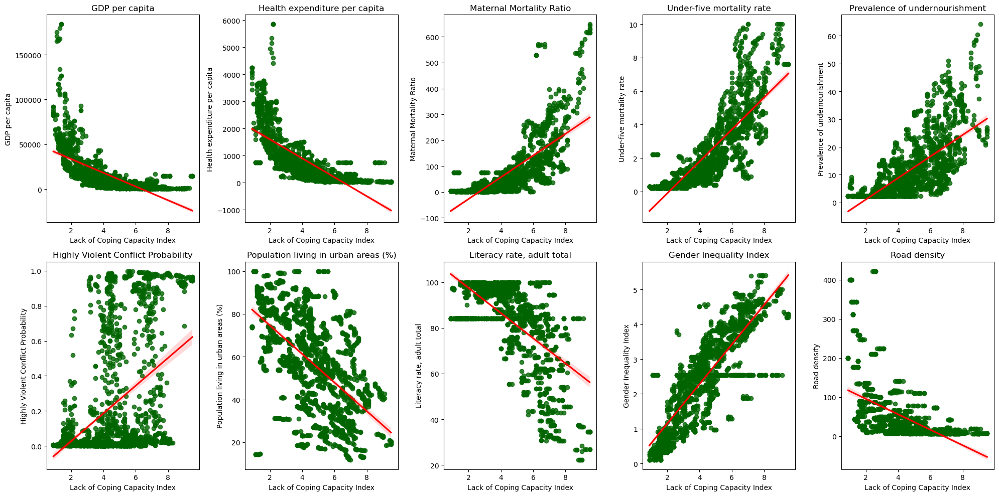

In [83]:
# Figure and subplots
fig, axes = plt.subplots(2, 5, figsize=(20, 10))

# Flatten the axes array to iterate over each subplot
axes = axes.flatten()

# Define x and y variables for each subplot
x_variable = 'Lack of Coping Capacity Index'

y_variables = ['GDP per capita',
             'Health expenditure per capita',
             'Maternal Mortality Ratio',
             'Under-five mortality rate',
             'Prevalence of undernourishment',
             'Highly Violent Conflict Probability',
             'Population living in urban areas (%)',
             'Literacy rate, adult total',
             'Gender Inequality Index',
             'Road density']

# Iterate over each subplot and plot your data
for i, ax in enumerate(axes):
    # Plot your data here, using different variables for each subplot
    sns.regplot(
        data=df,
        x=x_variable,
        y=y_variables[i],
        scatter_kws={"color": "darkgreen"},  # Set color of the scatter points
        line_kws={"color": "red"},  # Set color of the regression line
        ax=ax  # Specify the current subplot
    )
    # Set title for the subplot
    ax.set_title(f'{y_variables[i]}')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

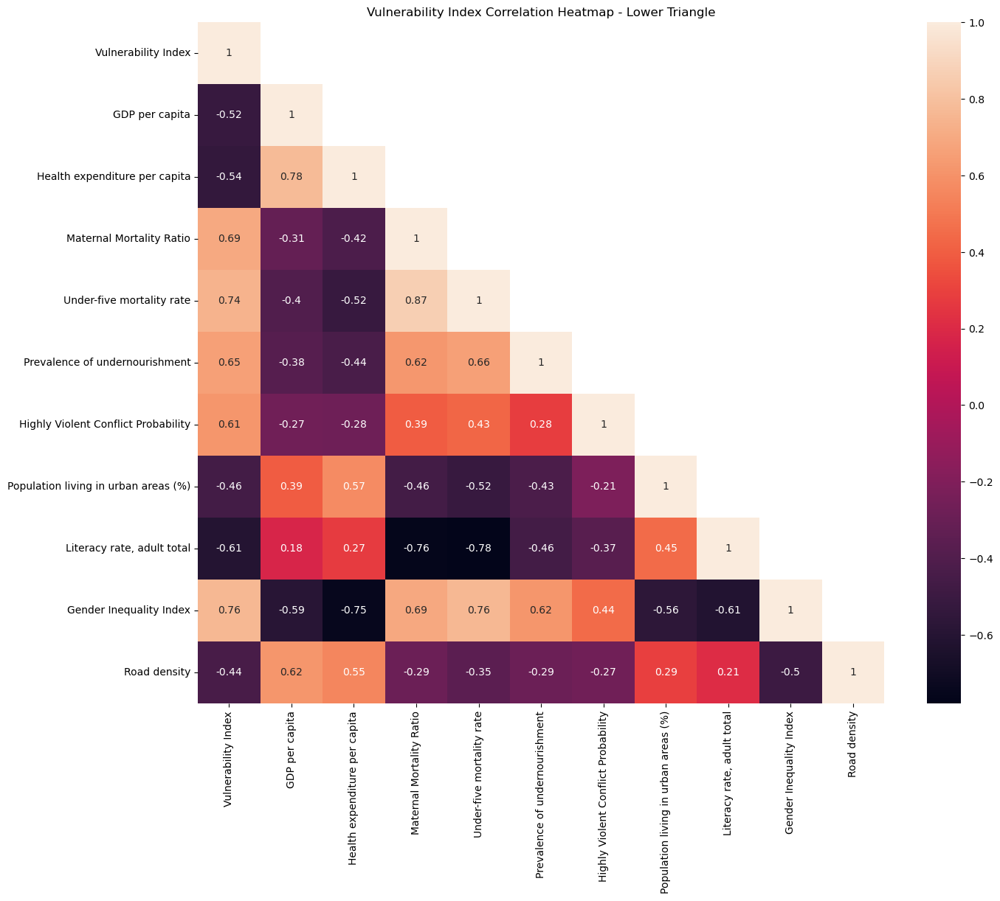

In [84]:
# Removing Upper or Lower Half of Corr Heatmap
inform = df[['Vulnerability Index',
             'GDP per capita',
             'Health expenditure per capita',
             'Maternal Mortality Ratio',
             'Under-five mortality rate',
             'Prevalence of undernourishment',
             'Highly Violent Conflict Probability',
             'Population living in urban areas (%)',
             'Literacy rate, adult total',
             'Gender Inequality Index',
             'Road density'       
       ]]

correlation_matrix = inform.corr() # Calculate the correlation matrix

mask = 1 - np.tril(np.ones_like(correlation_matrix)) # Create a mask for the upper triangle

# Create a heatmap of the correlation matrix showing only the lower triangle
plt.figure(figsize=(15, 12))
plt.title('Vulnerability Index Correlation Heatmap - Lower Triangle')
heatmap = sns.heatmap(correlation_matrix, mask=mask, annot=True) #annot=True adds the numbers to the matrix
plt.show()

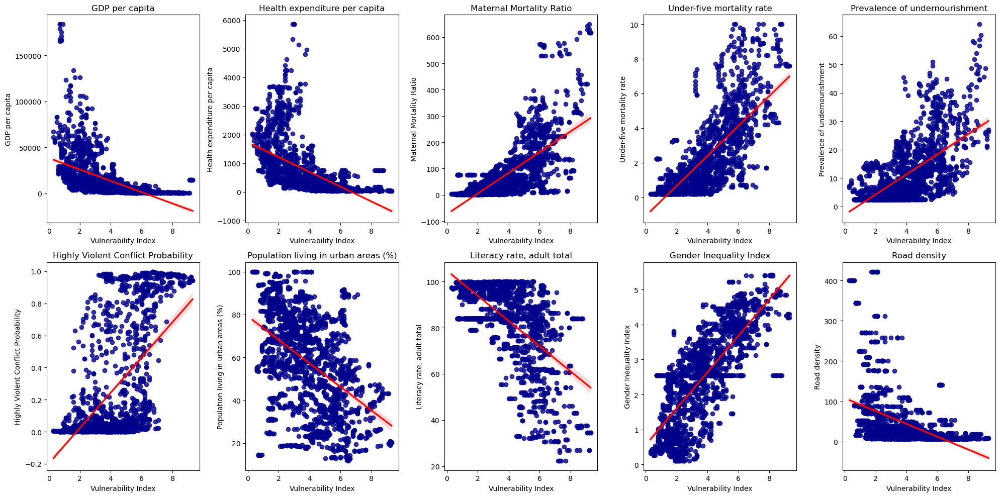

In [85]:
# Figure and subplots
fig, axes = plt.subplots(2, 5, figsize=(20, 10))

# Flatten the axes array to iterate over each subplot
axes = axes.flatten()

# Define x and y variables for each subplot
x_variable = 'Vulnerability Index'

y_variables = ['GDP per capita',
             'Health expenditure per capita',
             'Maternal Mortality Ratio',
             'Under-five mortality rate',
             'Prevalence of undernourishment',
             'Highly Violent Conflict Probability',
             'Population living in urban areas (%)',
             'Literacy rate, adult total',
             'Gender Inequality Index',
             'Road density']

# Iterate over each subplot and plot your data
for i, ax in enumerate(axes):
    # Plot your data here, using different variables for each subplot
    sns.regplot(
        data=df,
        x=x_variable,
        y=y_variables[i],
        scatter_kws={"color": "darkblue"},  # Set color of the scatter points
        line_kws={"color": "red"},  # Set color of the regression line
        ax=ax  # Specify the current subplot
    )
    # Set title for the subplot
    ax.set_title(f'{y_variables[i]}')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

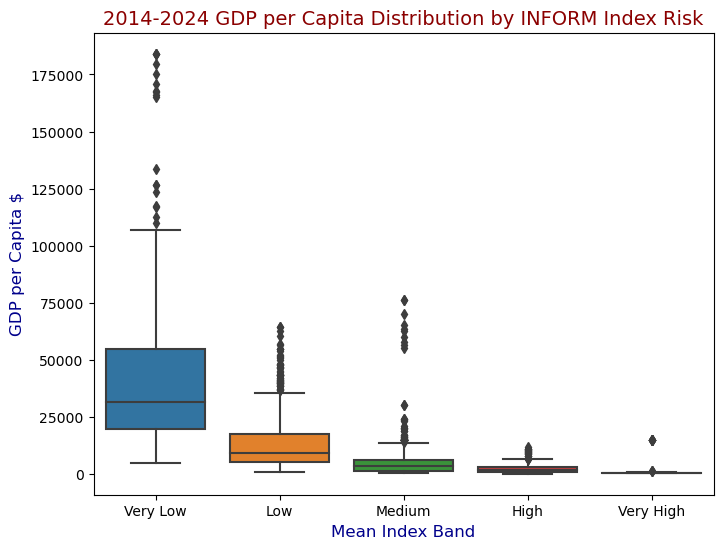

In [87]:
# Define the desired order of the bars
order = ['Very Low', 'Low', 'Medium', 'High', 'Very High']

# Create the boxplot using the new column
plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x="INFORM Index Category", y="GDP per capita", order=order)

# Set the title and labels
plt.title("2014-2024 GDP per Capita Distribution by INFORM Index Risk", color='darkred', fontsize=14)
plt.xlabel("Mean Index Band", color='darkblue', fontsize=12)
plt.ylabel("GDP per Capita $", color='darkblue', fontsize=12)

# Show plot
plt.show()

In [93]:
# Define the x variable
#x_variable = 'INFORM Index Category'

# Define y variables for each subplot
#y_variables = [
#             'Maternal Mortality Ratio','Under-five mortality rate','Prevalence of undernourishment','Highly Violent Conflict Probability',
#             'Population living in urban areas (%)','Literacy rate, adult total','Gender Inequality Index','Road density']

# Define the order of index categories
#order = ['Very Low', 'Low', 'Medium', 'High', 'Very High']

# Figure and subplots
#fig, axes = plt.subplots(2, 5, figsize=(20, 10), sharey=True)

# Flatten the axes array to iterate over each subplot
#axes = axes.flatten()

# Iterate over each subplot and plot the boxplot
#for i, y_var in enumerate(y_variables):
    # Plot the boxplot for the current y variable ordered by index category
 #   sns.boxplot(data=df, x=x_variable, y=y_var, ax=axes[i], order=order)
    
    # Set title for the subplot
  #  axes[i].set_title(f'Boxplot of {y_var} by {x_variable}')

# Adjust layout
#plt.tight_layout()

# Show the plot
#plt.show()


In [94]:
#Scatter plot INFORM Index and Core Indicator with a line of best fit
#plt.title('INFORM Index vs. Core Indicator')  # Add title
#sns.regplot(
#    data=df,
#    x="INFORM Risk Index",
#    y="GDP per capita",
#    scatter_kws={"color": "green"},  # Set color of the scatter points # kws is an abbreviation for keyword arguments
#    line_kws={"color": "red"}  # Set color of the regression line # kws is an abbreviation for keyword arguments
#)
#plt.show()

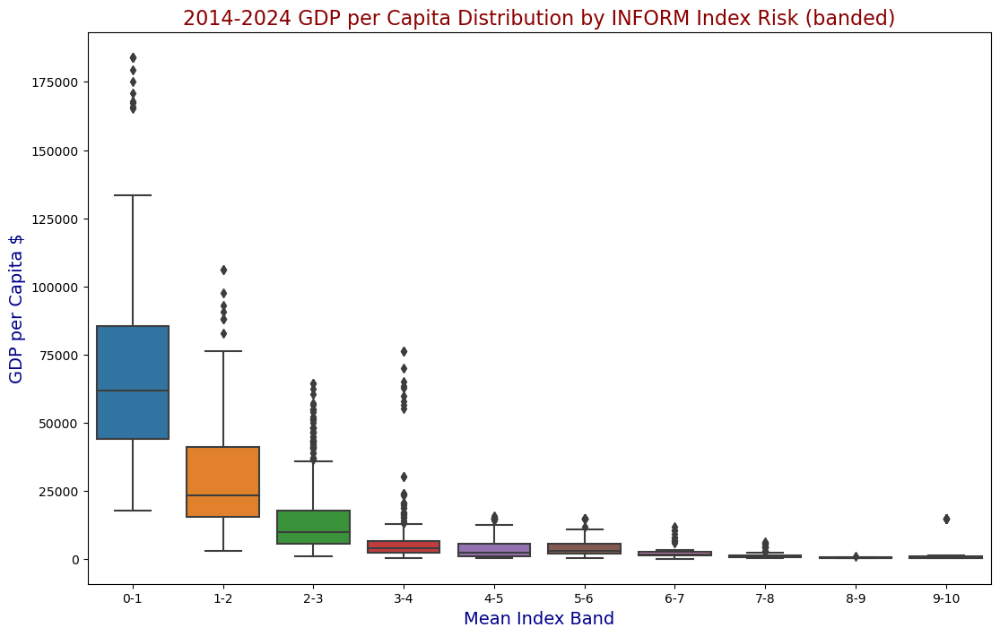

In [51]:
# Define the bin edges
bin_edges = np.arange(0, 11, 1)

# Define the bin labels as strings
bin_labels = [f"{i}-{i+1}" for i in range(10)]

# Create a new column with the bin labels
df['Index_Band'] = pd.cut(df['Mean_INFORM_Index'], bins=10, labels=bin_labels, include_lowest=True)

# Create the violin plot using the new column
plt.figure(figsize=(13, 8))
sns.boxplot(data=df, x="Index_Band", y="GDP per capita")

# Set the title and labels
plt.title("2014-2024 GDP per Capita Distribution by INFORM Index Risk (banded)", color='darkred', fontsize=16)
plt.xlabel("Mean Index Band", color='darkblue', fontsize=14)
plt.ylabel("GDP per Capita $", color='darkblue', fontsize=14)

# Show plot
plt.show()